# Fonctionnalités de base

## 1. Modules Python.
On va importer les modules python qui seront très utiles pour la suite.

In [207]:
#Python modules
import numpy as np
import math
import cv2
import matplotlib.pyplot as plt
import time
from google.colab import drive
from scipy.signal import convolve2d

In [208]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [209]:
import os
path = os.chdir('/content/drive/MyDrive/tp_mineur')

## 2. Charger une image.
Utilisez la fonction imread du module cv2 pour ouvrir une image de votre choix.

In [210]:
#Charger une Image

I=cv2.imread('cameraman.tif')
I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)

Affichons l'image pour verrifier que tout s'est bien passé :

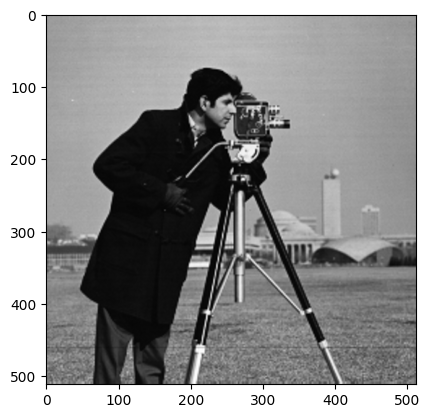

In [211]:
plt.imshow(I)

Tout marche correctement

## 3. Première fonction
Ecrivez une fonction qui charge une image et la convertit en python array de type float (utiliser une méthode de numpy pour la conversion).

In [212]:
def loadImage(filename):
    I = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)  # Nous chargeons ici notre image en niveaux de gris grace à cv2.IMREAD_GRAYSCALE

    return np.float64(I) / 255.0  # La ligne précédente nous a donné un tableau numpy (qui représente notre image) composé d'entiers entre 0 et 255
                                 # afin de pouvoir manipuler notre tableau plus facilement par la suite, on la convertit en valeurs flottantes,
                                 # puis on la normalise pour que les valeurs soient comprises entre 0 et 1

## 4. Affichage d'image

On donne cette fonction pour visualiser des images de type float.

In [213]:
def showImage(I,scale=1):
    plt.imshow(I,cmap='gray')
    plt.axis('off')
    size=plt.gcf().get_size_inches()
    plt.gcf().set_size_inches(scale*size)

a) Affichez une image à l'aide de la fonction précédente.

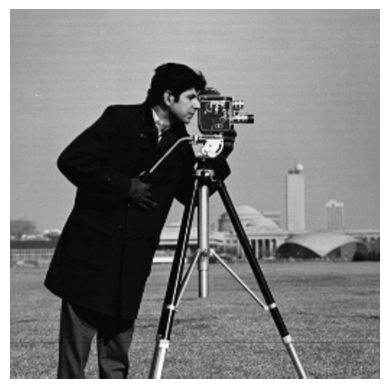

In [214]:
I = loadImage('cameraman.tif')

showImage(I,scale=1)

L'image est bien affichée, essayons avec une autre taille :

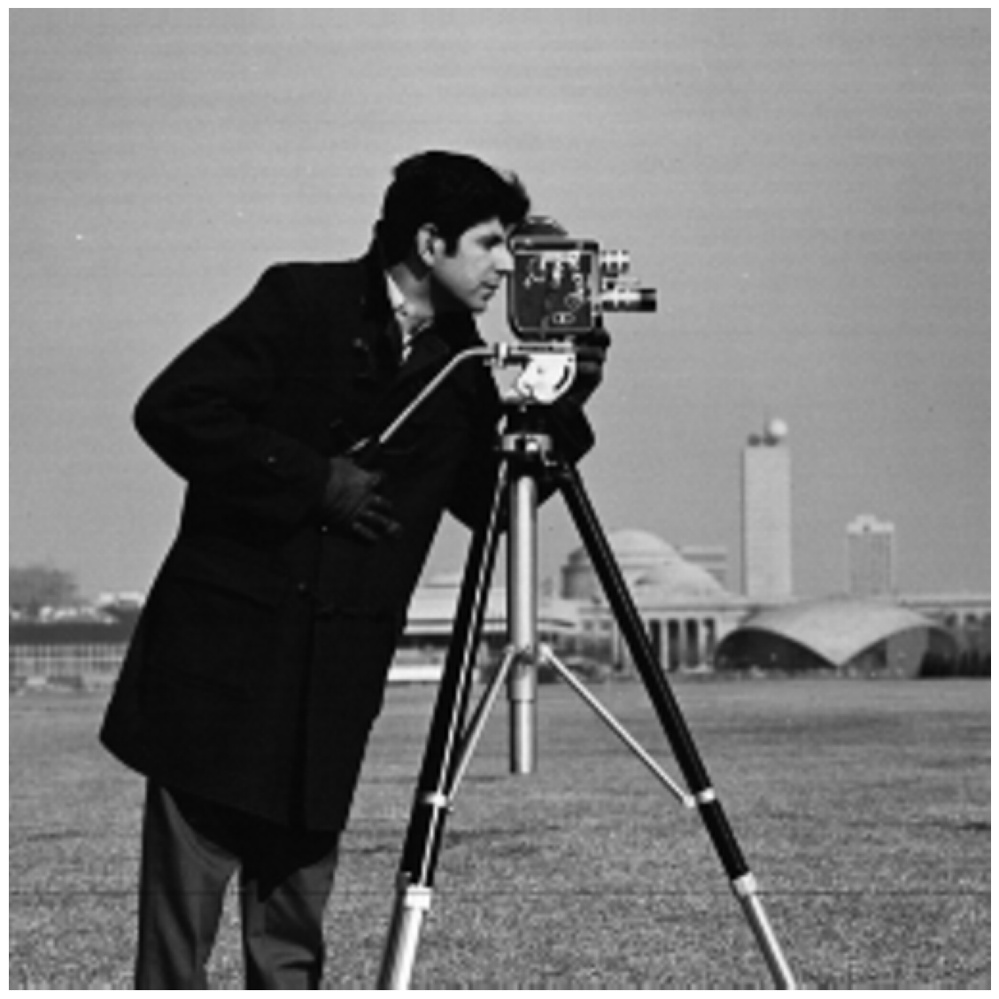

In [215]:
showImage(I,scale=3)

Tout semble marcher correctement

b) Affichez la même image avec une autre carte de couleur, par exemple jet

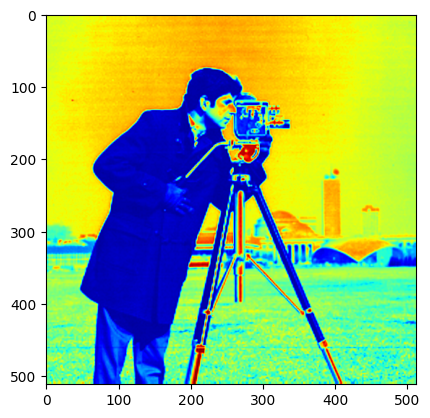

In [216]:
plt.imshow(I, cmap='jet')

# Equation de la chaleur

## 5. Laplacien

En utilisant une fonctionnalité de OpenCV (cv2), appliquez un filtre laplacien sur une image. Vous ferez particulièrement attention aux paramètres de la fonction utilisée.

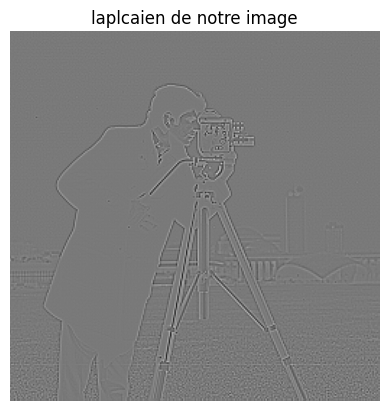

In [217]:
#Filtre laplacien
# Nous utilisons le paramettre donné en cours cv2.CV_64F

laplacian = cv2.Laplacian(I, cv2.CV_64F)
plt.title( "laplcaien de notre image")
showImage(laplacian)

Le Laplacien met en évidence les contours en détectant les variations d’intensité sur notre image.

En prenant la valeur absolue, on améliore la visualisation des contours, quelle que soit leur orientation. faisons le test :

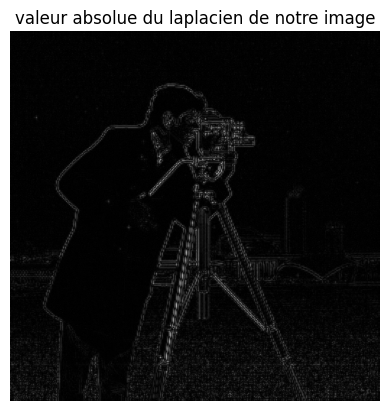

In [218]:
plt.title( "valeur absolue du laplacien de notre image")
showImage(np.abs(laplacian))

On observe que les contours de notre image sont bien mis en evidence



## 6. Discrétisation
Ecrivez une fonction qui implémente l'équation de la chaleur

À temps discret, l'équation de la chaleur se modélise de la manière suivante :


\begin{equation}
     \Delta u^{(n)}(i, j) =  \frac{u^{(n+1)}(i, j) - u^{(n)}(i, j)}{\Delta t}
\end{equation}

En réorganisant cette équation, nous obtenons la mise à jour suivante :

\begin{equation}
    u^{(n+1)}(i, j) = u^{(n)}(i, j) + \Delta t \cdot \Delta u^{(n)}(i, j)
\end{equation}

où :



- $u^{(n)}(i, j)$ est l'intensité du pixel à l'instant $n$.
- $\Delta u^{(n)}(i, j)$ est le Laplacien approximé ( notre cv2.Laplacian(image, cv2.CV_64F) dans le code )
- $\Delta t$ est le pas de temps ( notre dt dans le code )


Nous allons ainsi implanter cela :

In [219]:
def HeatEquation(I,dt,n):
  image = I.copy()
  for _ in range(n):
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    image = image + dt * laplacian
  return image

Testez la fonction avec différents paramètres comme vus en cours.  
Affichez l'image résultat à chaque fois et vérifiez que tout est bien cohérent.  
Que donne votre fonction avec dt=0.26 ?

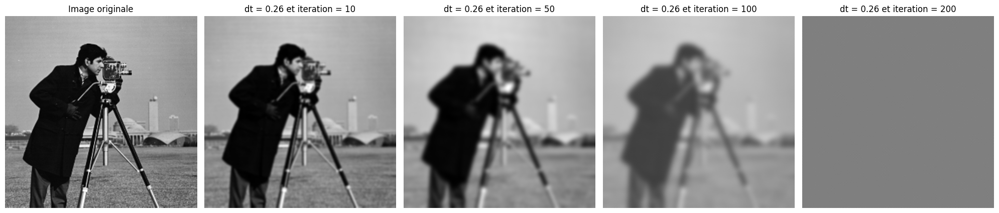

In [220]:
dt = 0.26
n_values = [10, 50, 100, 200]


plt.figure(figsize=(20, 20))

# Image originale
plt.subplot(1, len(n_values) + 1, 1)
plt.imshow(I, cmap='gray')
plt.title("Image originale")
plt.axis("off")

# Affichage des images filtrées avec différentes valeurs de n
for idx, n in enumerate(n_values, 2):
    smoothed_image = HeatEquation(I, dt, n)
    plt.subplot(1, len(n_values) + 1, idx)
    plt.imshow(smoothed_image, cmap='gray')
    plt.title(f"dt = {dt} et iteration = {n}")
    plt.axis("off")

# Affichage
plt.tight_layout()
plt.show()

Conclusion : Avec dt= 0.26, la diffusion se fait très rapidement, a 50 iterations l’image apparaît déjà bien lissée, et plus le nombre d’itérations augmente, plus l’effet de flou s’accentue, jusqu’à ce que l’image perde complètement ses contours et devienne completement grise.

Le pas semble trop grand et la diffusion trop rapide

Testons avec plus de valeurs :

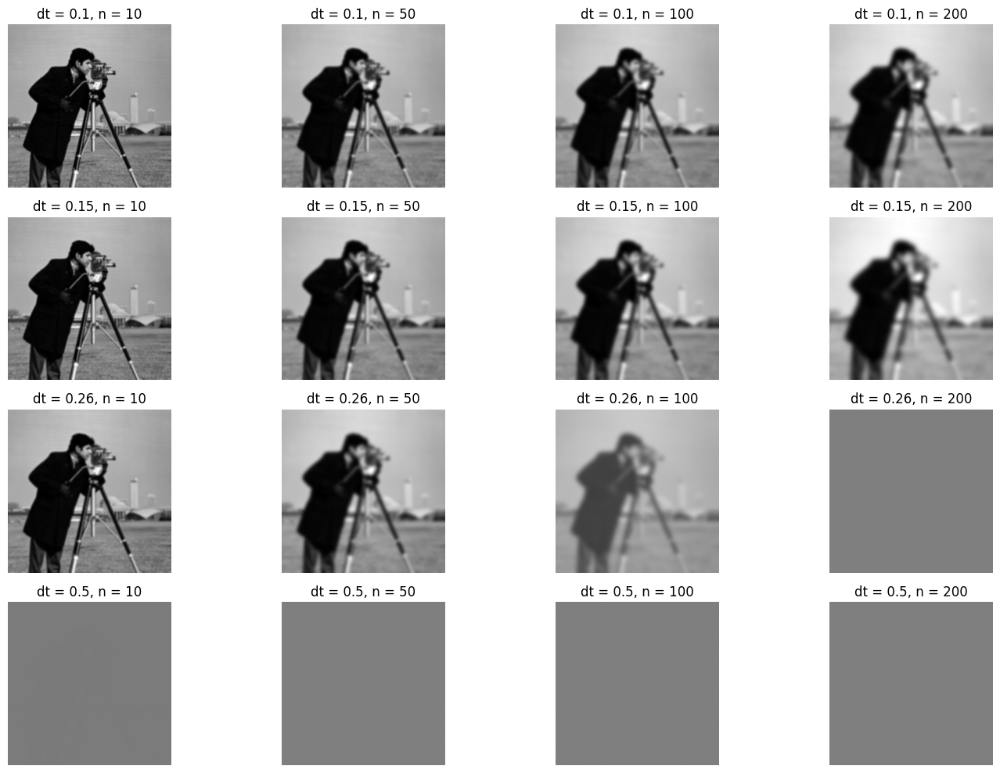

In [221]:
dt_values = [0.1, 0.15, 0.26, 0.50]
n_values = [10, 50, 100, 200]


plt.figure(figsize=(15, 10))


for row, dt in enumerate(dt_values):
    for col, n in enumerate(n_values):
        smoothed_image = HeatEquation(I, dt, n)

        plt.subplot(len(dt_values), len(n_values), row * len(n_values) + col + 1)

        plt.imshow(smoothed_image, cmap='gray')
        plt.title(f"dt = {dt}, n = {n}")
        plt.axis("off")

plt.tight_layout()
plt.show()

Conlusion : dt, qui est le pas temporel, contrôle la vitesse de diffusion, et
n représente le temps que nous laissons à cette diffusion pour agir, Un petit dt permet une diffusion progressive, alors qu’un dt plus grand accélère fortement le processus. Lorsque dt est trop élevé, l’image se floute très rapidement et peut finir par perdre toute sa structure

En ce qui concerne n, plus n est grand, plus la diffusion a le temps de s’appliquer. Si dt est déjà élevé, un n trop grand peut amplifier l’effet jusqu'a effacer complètement les détails de l’image. C’est ce qu’on observe avec notre dt = 0.26, a n = 50, l’image reste encore visible, mais à
n=200, la diffusion a eu trop de temps pour agir, et l’image devient complètement grise.

Pour dt = 0.5, le pas est deja trop fort est la diffusion se fait instantanément

## 7. Filtre gaussien sur une image
Appliquez un filtre gaussien sur une image en utilisant la fonction $\texttt{GaussianBlur}$ de $\texttt{openCV}$.

In [222]:
kernel = np.ones((5,5),np.float64)/(25)
blur_I=cv2.filter2D( I, -1, kernel)
blur_I2=cv2.GaussianBlur(I,(5,5),25)

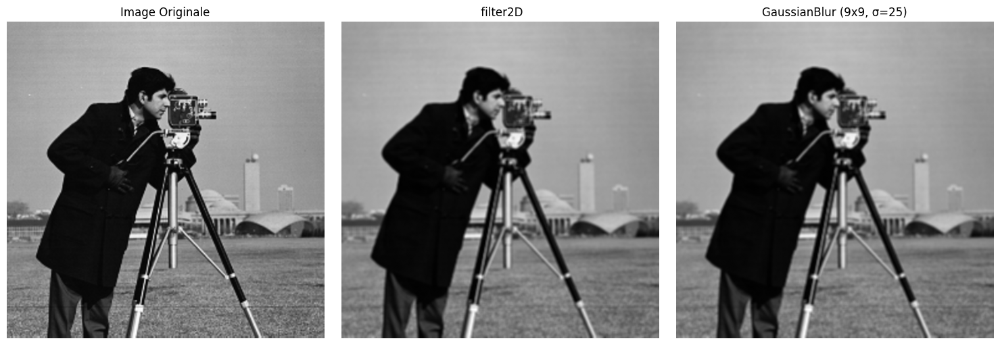

In [223]:
plt.figure(figsize=(15, 5))

# Image originale
plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.title("Image Originale")
plt.axis("off")

# Image avec filtre moyen
plt.subplot(1, 3, 2)
plt.imshow(blur_I, cmap='gray')
plt.title(" filter2D")
plt.axis("off")

# Image avec filtre Gaussien
plt.subplot(1, 3, 3)
plt.imshow(blur_I2, cmap='gray')
plt.title("GaussianBlur (9x9, σ=25)")
plt.axis("off")

plt.tight_layout()
plt.show()

## 8. Comparaison EDP/Filtre
En choisissant les bons paramètres, montrez l'équivalence vue en cours entre filtre gaussien et équation de la chaleur.


Afin de montrer l'equivalence, on va monter que selon certains paramettre optimaux, l'image apres application de l'equation de la chaleur, va tendre vers notre image apres traitement du filtre gaussien ( ici celui que nous avons defini plus haut), donc ou la difference des deux tend vers 0.

Donc pour le mettre en equation, l’objectif est de chercher les paramettres qui minimisent la différence entre les deux images :

$$arg\min_{n,dt} \; \| I_{\text{heat}}(n, dt) - I_{\text{gauss}} \|$$

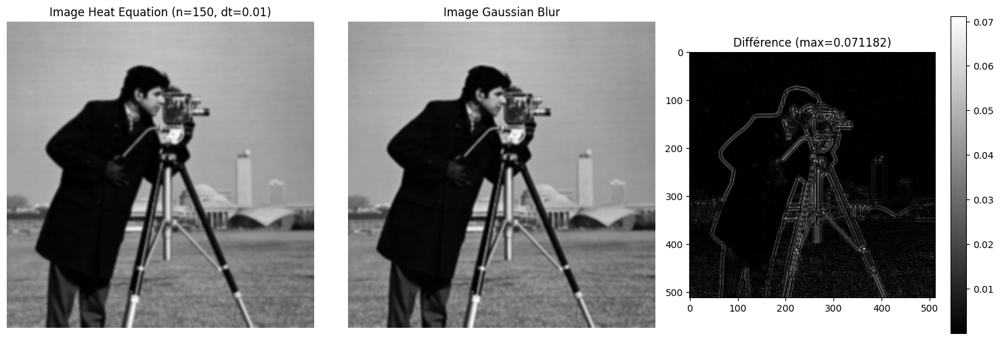

Meilleurs paramètres trouvés : n=150, dt=0.01
Différence minimale : 0.071182


In [224]:
#Je definis les pas et le iterations que nous allons tester
n_values = [50, 100, 150, 200, 250]
dt_values = [0.01, 0.1, 0.15, 0.2, 0.25]

# Nous initialisons notre min
min_difference = float("inf")
best_params = None


for n in n_values:
    for dt in dt_values:
        # Appliquation de l'équation de la chaleur
        smoothed_I = HeatEquation(I, dt, n)

        # Calcul de la différence absolue entre les images
        difference = np.abs(smoothed_I - blur_I2).max()

        # minimisation
        if difference < min_difference:
            min_difference = difference
            best_params = (n, dt)

# Meilleurs paramètres
n_opt, dt_opt = best_params

# Apres avoir trouvé les meilleurs paramettres, nous réappliquons à nouveau l'équation de la chaleur avec les meilleurs paramètres
smoothed_I_opt = HeatEquation(I, dt_opt, n_opt)

plt.figure(figsize=(15, 5))

# Image Heat Equation optimisée
plt.subplot(1, 3, 1)
plt.imshow(smoothed_I_opt, cmap='gray')
plt.title(f"Image Heat Equation (n={n_opt}, dt={dt_opt})")
plt.axis("off")

# Image Gaussianblur déjà calculée plus haut
plt.subplot(1, 3, 2)
plt.imshow(blur_I2, cmap='gray')
plt.title("Image Gaussian Blur")
plt.axis("off")

# Différence entre les deux images
diff = np.abs(smoothed_I_opt - blur_I2)
plt.subplot(1, 3, 3)
im = plt.imshow(diff, cmap='gray')
plt.title(f"Différence (max={min_difference:.6f})")
plt.colorbar(im)

# Affichage


plt.tight_layout()
plt.show()

print(f"Meilleurs paramètres trouvés : n={n_opt}, dt={dt_opt}")
print(f"Différence minimale : {min_difference:.6f}")

Ainsi, nous avons réussi à ajuster les paramètres de l’équation de la chaleur pour obtenir un flou quasi identique à celui du filtre gaussien, avec une différence de 0.07.
Nous avons donc empiriquement montré l'equivalence entre les deux methodes.
l'ecart entre les deux methodes a surtout lieu sur les contours

# Modèle de Malik et Perona

## 9. Dérivée directionnelle
Ecrire une fonction qui donne les 4 filtres 3x3 vus en cours

In [225]:
# On définit d'abord les fonctions gradient N, S, W, E via une seule fonction
def gradientDir(direction):
    if direction =='N':
        return np.array([[0, 1, 0], [0, -1, 0],[0, 0, 0]])
    if direction =='S':
        return np.array([[0, 0, 0], [0, -1, 0], [0, 1, 0]])
    if direction =='W':
        return np.array([[0, 0, 0], [1, -1, 0], [0, 0, 0]])
    if direction =='E':
        return np.array([[0, 0, 0], [0, -1, 1], [0, 0, 0]])

## 10. Fonctions agissant sur la norme du gradient
a. Définissez les deux fonctions $f_1:(x,\lambda)\rightarrow \exp(-(x/\lambda)^2)$ et $f_2:(x,\lambda)\rightarrow 1/(1+(x/\lambda)^2))$

In [226]:
"""

Nous les utiliserons plus tard

f1 = np.vectorize(lambda x: np.exp(-(x/la)**2))
f2 = np.vectorize(lambda x: 1 / (1 + (x/la)**2))
"""

def f1(x, lamda):
    return np.exp(- (x / lamda) ** 2)

def f2(x, lamda):
    return 1 / (1 + (x / lamda) ** 2)

b. Visualisez la courbe de $f_1$ et $f_2$ pour différentes valeurs de $\lambda$

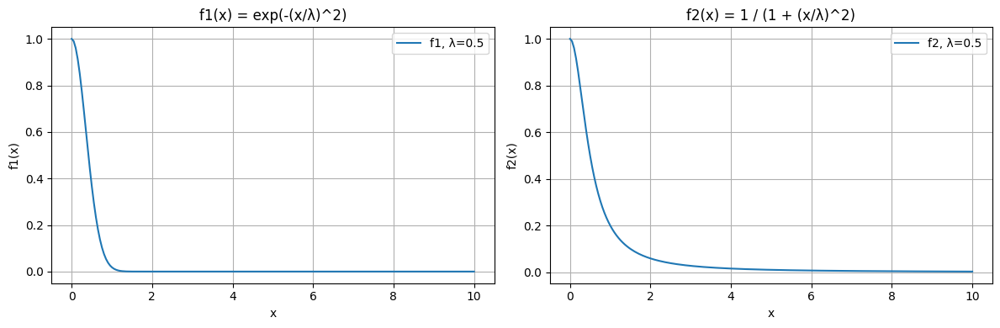

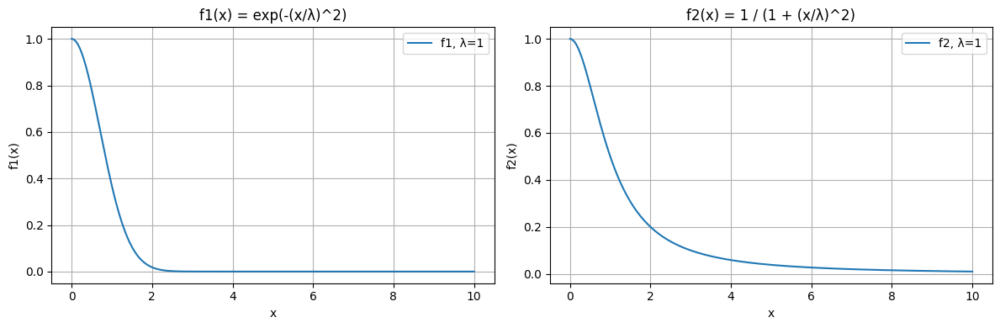

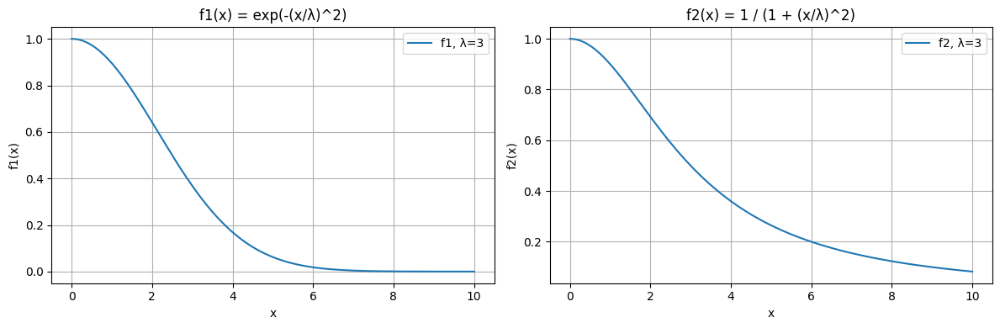

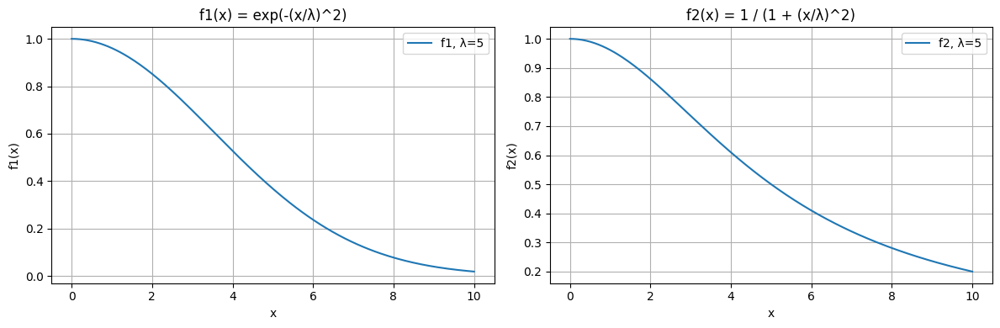

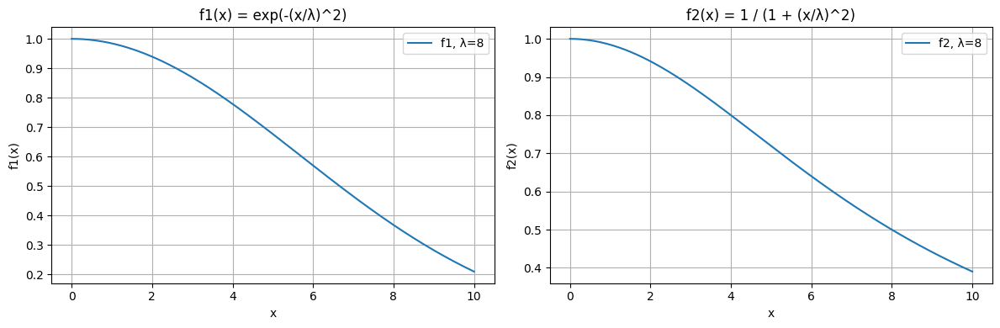

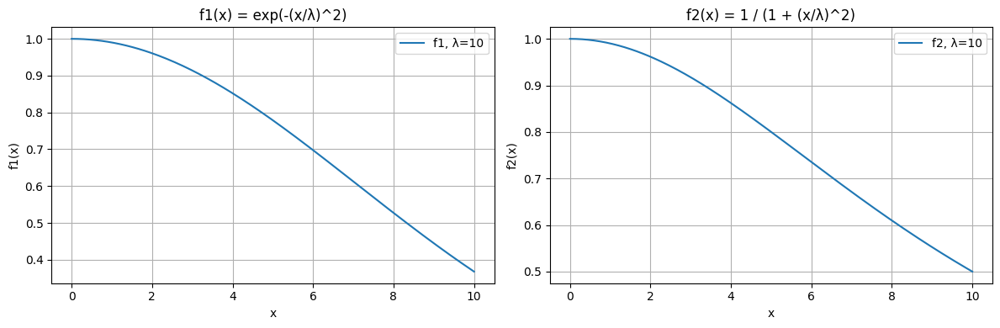

In [227]:
lambdas = [0.5, 1, 3, 5, 8, 10]
x = np.linspace(0, 10, 200)

for lam in lambdas:
    plt.figure(figsize=(12, 4))

    # f1
    plt.subplot(1, 2, 1)
    plt.plot(x, f1(x, lam), label=f'f1, λ={lam}')
    plt.title("f1(x) = exp(-(x/λ)^2)")
    plt.xlabel("x")
    plt.ylabel("f1(x)")
    plt.legend()
    plt.grid(True)

    # f2
    plt.subplot(1, 2, 2)
    plt.plot(x, f2(x, lam), label=f'f2, λ={lam}')
    plt.title("f2(x) = 1 / (1 + (x/λ)^2)")
    plt.xlabel("x")
    plt.ylabel("f2(x)")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

c. Appliquez la fonction $f_1$ ou $f_2$ aux dérivées directionnelles de l'image. On veut ensuite visualiser les différents $f(|\nabla_X I(x,y)|)$

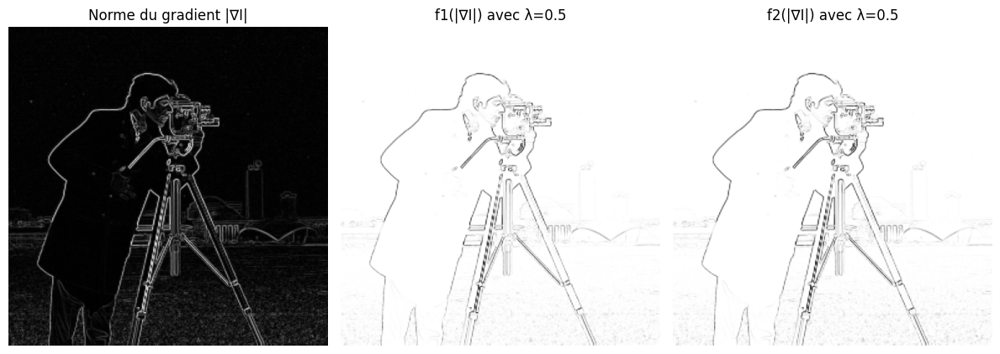

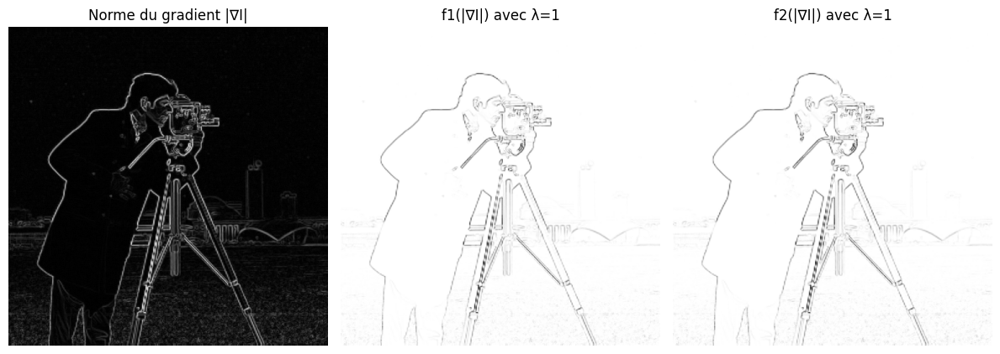

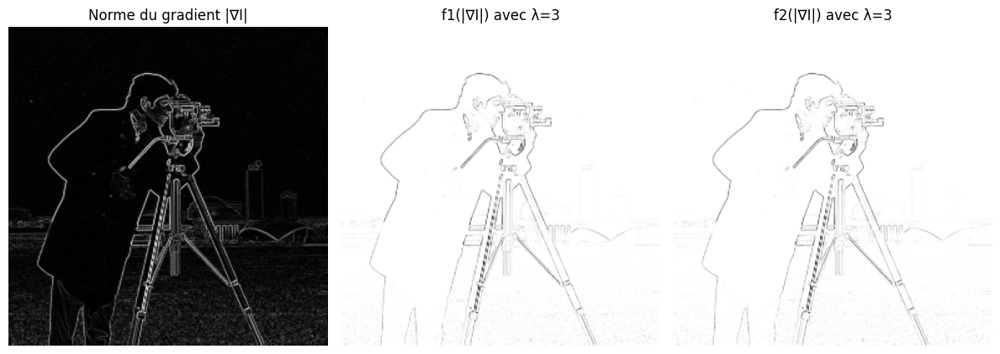

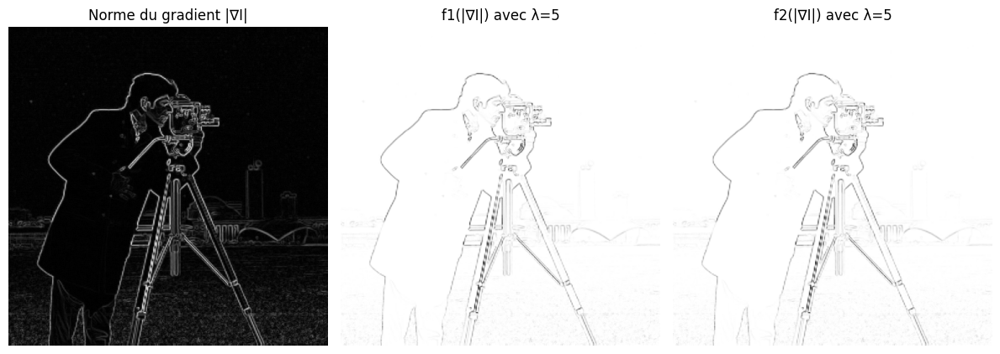

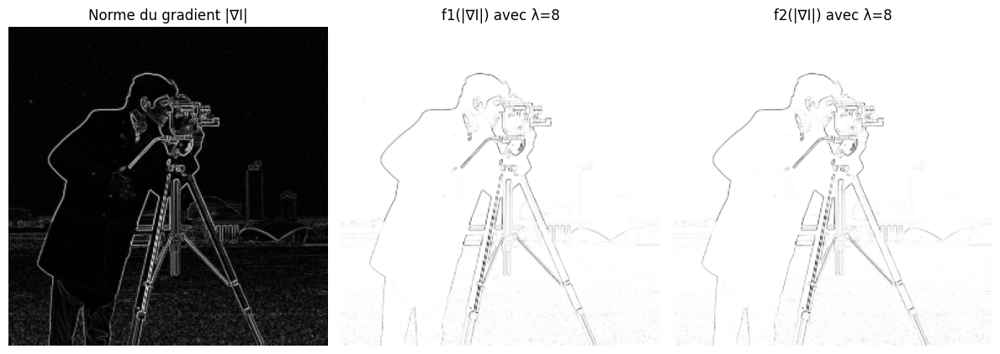

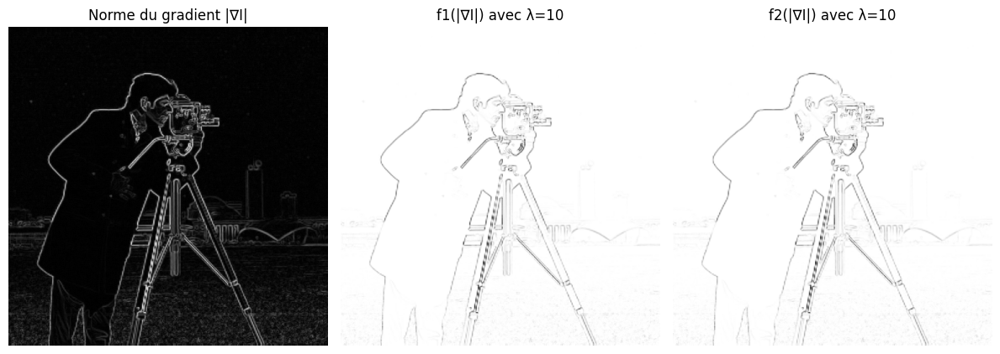

In [228]:
grad_x = cv2.filter2D(I, -1, gradientDir('E'))  # Gradient en X (est-ouest)
grad_y = cv2.filter2D(I, -1, gradientDir('N'))  # Gradient en Y (nord-sud)

# Calcul de la magnitude du gradient |∇I|
grad_mag = np.sqrt(grad_x ** 2 + grad_y ** 2)

# Liste des valeurs de lambda à tester
lambda_values = [0.5, 1, 3, 5, 8, 10]

# Affichage des résultats pour chaque lambda
for lam in lambda_values:
    f1_grad = f1(grad_mag, lam)
    f2_grad = f2(grad_mag, lam)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(grad_mag, cmap='gray')
    plt.title("Norme du gradient |∇I|")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(f1_grad, cmap='gray')
    plt.title(f"f1(|∇I|) avec λ={lam}")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(f2_grad, cmap='gray')
    plt.title(f"f2(|∇I|) avec λ={lam}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

Ne voyant aucune différence, j'ai décidé de normaliser notre gradient afin de réduire la plage des valeurs et rendre les effets des fonctions f1 et f2 plus visibles

Voici la formule que nous allons appliquer pour normaliser le gradient :
$$|\nabla I|_{\text{norm}} = \frac{|\nabla I| - \min(|\nabla I|)}{\max(|\nabla I|) - \min(|\nabla I|)}$$

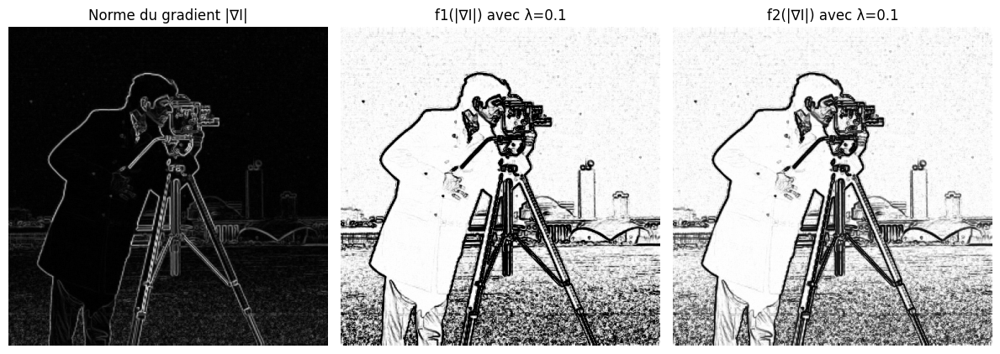

λ=0.1 :  Min de f1(|∇I|) : 0.0000
λ=0.1 :  Min de f2(|∇I|) : 0.0099 


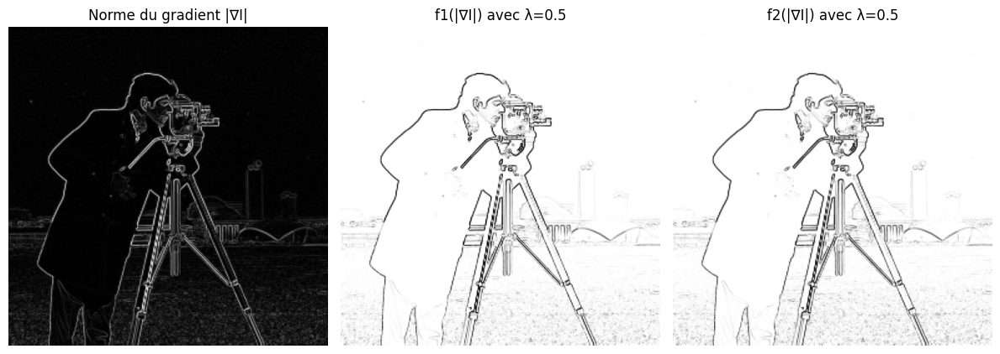

λ=0.5 :  Min de f1(|∇I|) : 0.0183
λ=0.5 :  Min de f2(|∇I|) : 0.2000 


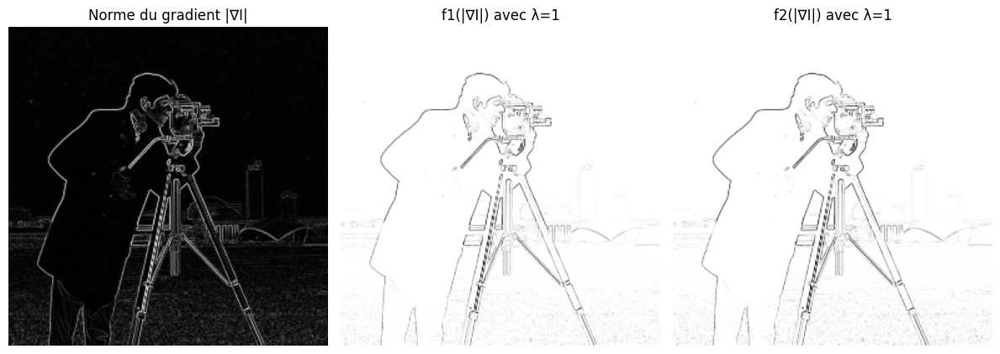

λ=1 :  Min de f1(|∇I|) : 0.3679
λ=1 :  Min de f2(|∇I|) : 0.5000 


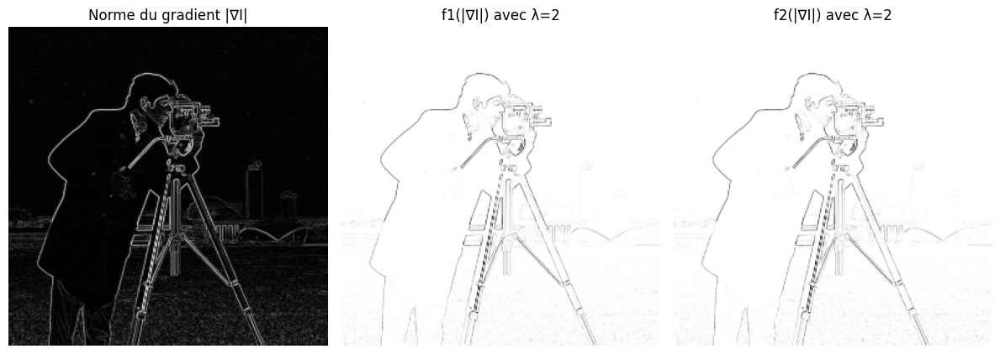

λ=2 :  Min de f1(|∇I|) : 0.7788
λ=2 :  Min de f2(|∇I|) : 0.8000 


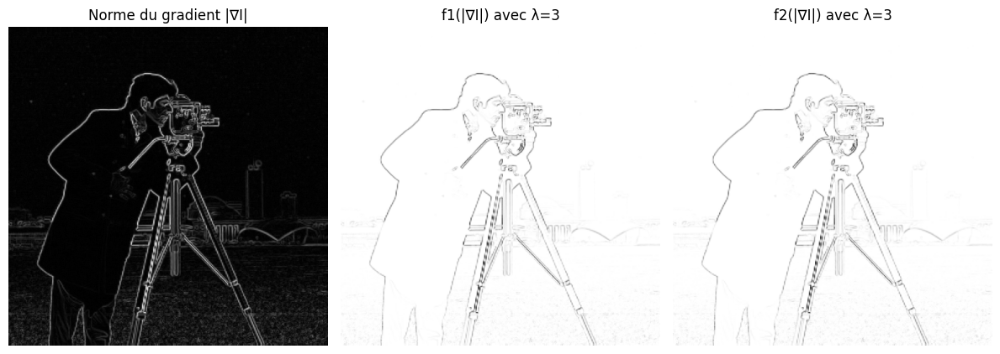

λ=3 :  Min de f1(|∇I|) : 0.8948
λ=3 :  Min de f2(|∇I|) : 0.9000 


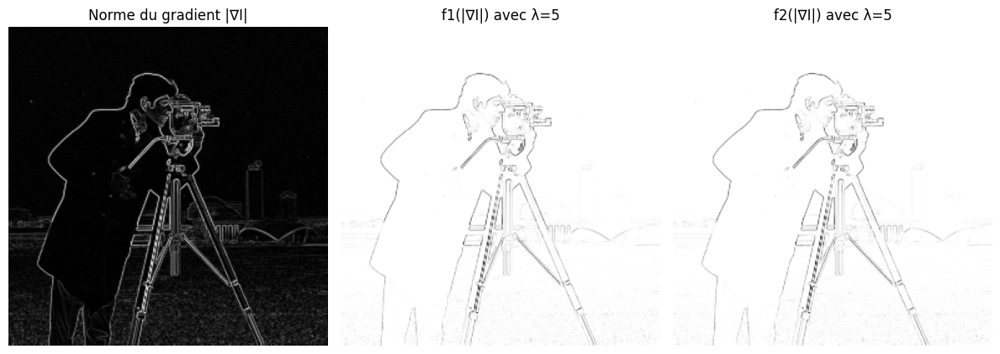

λ=5 :  Min de f1(|∇I|) : 0.9608
λ=5 :  Min de f2(|∇I|) : 0.9615 


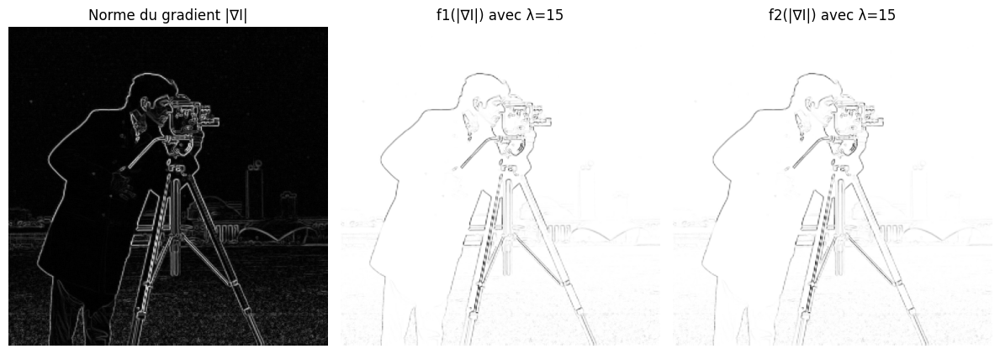

λ=15 :  Min de f1(|∇I|) : 0.9956
λ=15 :  Min de f2(|∇I|) : 0.9956 


In [229]:
grad_x = cv2.filter2D(I, -1, gradientDir('E'))  # Gradient en X (est-ouest)
grad_y = cv2.filter2D(I, -1, gradientDir('N'))  # Gradient en Y (nord-sud)

# Calcul de la magnitude du gradient
grad_mag = np.sqrt(grad_x ** 2 + grad_y ** 2)

# normalisation entre [0,1] pour éviter des valeurs trop faibles ou trop fortes
grad_mag = (grad_mag - grad_mag.min()) / (grad_mag.max() - grad_mag.min())

lambda_values = [0.1, 0.5, 1, 2, 3, 5, 15]

for lam in lambda_values:
    f1_grad = f1(grad_mag, lam)
    f2_grad = f2(grad_mag, lam)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(grad_mag, cmap='gray')
    plt.title("Norme du gradient |∇I|")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(f1_grad, cmap='gray')
    plt.title(f"f1(|∇I|) avec λ={lam}")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(f2_grad, cmap='gray')
    plt.title(f"f2(|∇I|) avec λ={lam}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    print(f"λ={lam} :  Min de f1(|∇I|) : {f1_grad.min():.4f}")
    print(f"λ={lam} :  Min de f2(|∇I|) : {f2_grad.min():.4f} ")

Conclusion : Quand λ est trop petit, une sorte de bruit s'ajoute sur l'image, les contours sont très marqués, mais ce bruit fait perdre de l'information, ce bruit apparait parce que le faible lambda accentue beaucoup trop les faibles variations du gradient, donc meme une variation qui n'est pas vraiment un contour va apparaitre, par exemple les herbes lorsque lambda est bas apparaissent fortement, sans que ce soit une information particulierement pertinente

Quand λ est trop fort, seules les fortes variations sont mises en évidence, les détails fins sont lissés, par exemple, la tour en fond a ses contours très mal représentés.

λ = 1 et λ = 2 est un bon compromis, il n'ajoute que très peu de bruit et met assez bien en évidence les contours (d'un point de vue purement qualitatif).

## 11. Méthode de Malik et Perona
a. Ecrivez la fonction principale qui applique le lissage anisotrope à une image d'entrée I.

On reprenant le code du cours, nous avons :

In [230]:
def MalikPerona(I,dt,n,f):
    smoothed_I=np.copy(I)
    for i in range(n):
        print(i)
        var_I = np.zeros(I.shape)
        for d in ['N','S','E','W']:
            kernel=gradientDir(d)
            grad_I= cv2.filter2D(smoothed_I,-1,kernel)
            var_I += f(grad_I)*grad_I
        smoothed_I=smoothed_I + dt*var_I
    return smoothed_I

b. Visualisez les images résultat (attention, ne pas dépasser n=30 itérations pour le moment)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


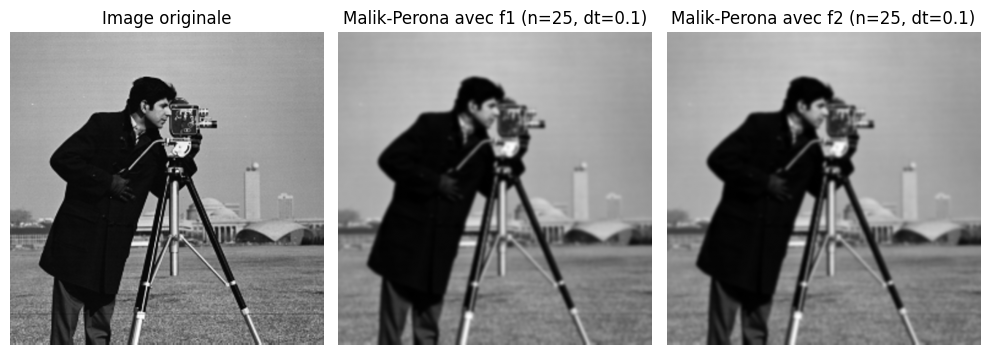

In [231]:
dt = 0.1
n = 25
la = 2

#Nous allons utiliser les fonctions difinies comme cela pour plus de facilités
f1 = np.vectorize(lambda x: np.exp(-(x/la)**2))
f2 = np.vectorize(lambda x: 1 / (1 + (x/la)**2))

# Application de la méthode de Perona-Malik avec f1 et f2
Malik_I = MalikPerona(I, dt, n, f1)
Malik_I_f2 = MalikPerona(I, dt, n, f2)

# Affichage des résultats
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.title("Image originale")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(Malik_I, cmap='gray')
plt.title(f"Malik-Perona avec f1 (n={n}, dt={dt})")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(Malik_I_f2, cmap='gray')
plt.title(f"Malik-Perona avec f2 (n={n}, dt={dt})")
plt.axis("off")

plt.tight_layout()
plt.show()

c. Visualisez également des lignes ou des colonnes des images d'origine et traitées

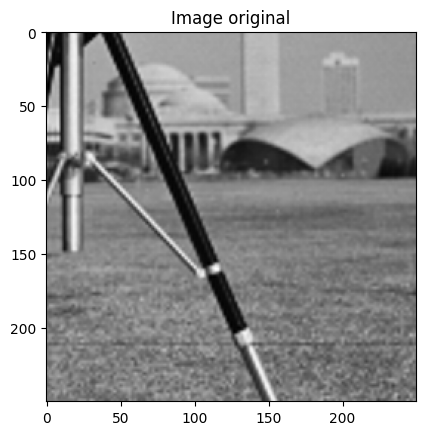

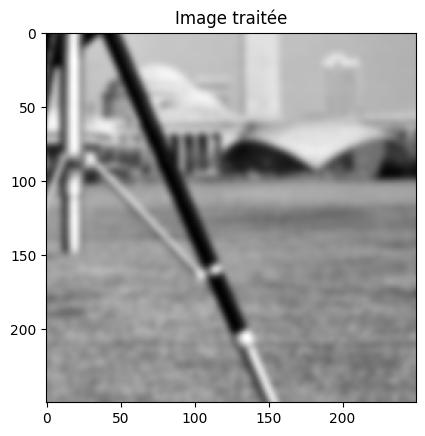

In [232]:
plt.imshow(I[250:500,250:500], cmap='gray')
plt.title('Image original')
plt.show()
plt.imshow(Malik_I[250:500,250:500], cmap='gray')
plt.title('Image traitée')
plt.show()

Conclusion : l'image est bien flouté, il faudrait maintneant comparé la qualité des contours entre les differentes methodes

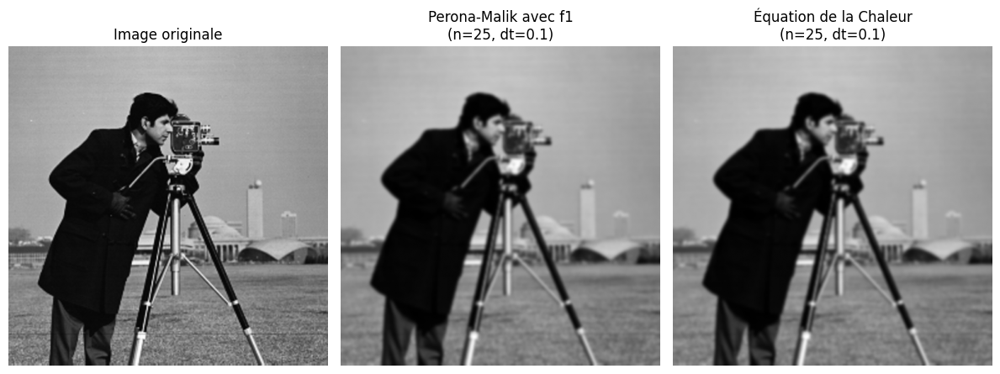

In [233]:
plt.figure(figsize=(12, 5))
Heat_I = HeatEquation(I, dt, n)

plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.title("Image originale")
plt.axis("off")

# Perona-Malik avec f1
plt.subplot(1, 3, 2)
plt.imshow(Malik_I, cmap='gray')
plt.title(f"Perona-Malik avec f1\n(n={n}, dt={dt})")
plt.axis("off")


# Équation de la chaleur
plt.subplot(1, 3, 3)
plt.imshow(Heat_I, cmap='gray')
plt.title(f"Équation de la Chaleur\n(n={n}, dt={dt})")
plt.axis("off")

plt.tight_layout()
plt.show()

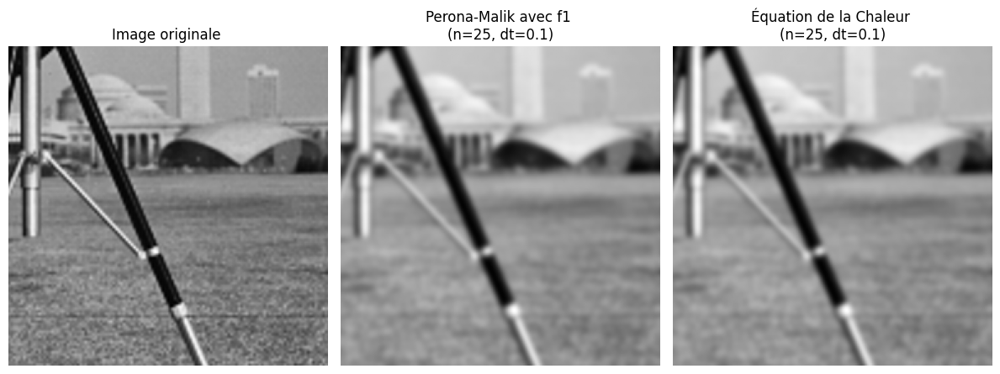

In [234]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(I[250:500,250:500], cmap='gray')
plt.title("Image originale ")
plt.axis("off")


plt.subplot(1, 3, 2)
plt.imshow(Malik_I[250:500,250:500], cmap='gray')
plt.title(f"Perona-Malik avec f1 \n(n={n}, dt={dt})")
plt.axis("off")


plt.subplot(1, 3, 3)
plt.imshow(Heat_I[250:500,250:500], cmap='gray')
plt.title(f"Équation de la Chaleur \n(n={n}, dt={dt})")
plt.axis("off")

plt.tight_layout()
plt.show()

Les deux methodes ( equation de la chaleur et malik perona ) sont assez similaire en terme de resultats